In [ ]:
# Mount the Google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Import libraries
import os
import numpy as np
import matplotlib.pyplot as plt
import csv
from PIL import Image
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, Subset
import torchvision
from torchvision import transforms
import torch.optim as optim

In [ ]:
# Install the Cleverhans library (provides adversarial attacks)
!pip install -qq git+http://github.com/tensorflow/cleverhans.git#egg=cleverhans

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.7/154.7 kB 4.0 MB/s eta 0:00:00


In [ ]:
# Import PGD attack
import cleverhans

from cleverhans.torch.attacks.projected_gradient_descent import projected_gradient_descent

# Dataset Loading

In [ ]:
# Download the dataset
!wget https://www.webpages.uidaho.edu/vakanski/Codes_Data/LFW-dataset.zip

--2024-02-22 00:00:38--  https://www.webpages.uidaho.edu/vakanski/Codes_Data/LFW-dataset.zip
Resolving www.webpages.uidaho.edu (www.webpages.uidaho.edu)... 129.101.105.230
Connecting to www.webpages.uidaho.edu (www.webpages.uidaho.edu)|129.101.105.230|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12467105 (12M) [application/x-zip-compressed]
Saving to: ‘LFW-dataset.zip’

LFW-dataset.zip     100%[===================>]  11.89M  4.53MB/s    in 2.6s    

2024-02-22 00:00:41 (4.53 MB/s) - ‘LFW-dataset.zip’ saved [12467105/12467105]



In [ ]:
# Uncompress the dataset
!unzip -uq 'LFW-dataset.zip' -d 'sample_data/'

In [ ]:
# Define a function for loading the dataset
class MyDataset(Dataset):
    def __init__(self, root_dir, transform, split):
        self.root_dir = root_dir
        self.image_folder = os.path.join(root_dir, split)
        self.labels_file = np.genfromtxt(root_dir + split + "_labels.csv", delimiter=',', dtype=np.int32)
        self.transform = transform

    def __len__(self):
        return len(self.labels_file)

    def __getitem__(self, idx):
        img_name = os.path.join(self.image_folder, f'img_{idx + 1:04}.jpg')
        image = Image.open(img_name)
        image = self.transform(image)
        label = self.labels_file[idx]
        label = torch.tensor(label, dtype=torch.long)

        return image, label

In [ ]:
# Define the transform to preprocess the data
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize the images to 224 x 224 pixels
    transforms.ToTensor(),  # Convert the images to a PyTorch tensor
])

In [ ]:
# Download the train, test, and validation datasets
train_dataset = MyDataset(root_dir='sample_data/LFW-dataset/', transform=transform, split='train')
test_dataset = MyDataset(root_dir='sample_data/LFW-dataset/', transform=transform, split='test')
val_dataset = MyDataset(root_dir='sample_data/LFW-dataset/', transform=transform, split='validation')

In [ ]:
# Check the datasets
print('Train dataset length:', len(train_dataset))
print('Test dataset length:', len(test_dataset))
print('Validation dataset length:', len(val_dataset))


Train dataset length: 3043
Test dataset length: 1049
Validation dataset length: 1021


In [ ]:
# Create dataloaders to iterate over the datasets
train_dataloader = DataLoader(train_dataset, shuffle=True, batch_size=64)
test_dataloader = DataLoader(test_dataset, shuffle=False, batch_size=64)
val_dataloader = DataLoader(val_dataset, shuffle=False, batch_size=64)

In [ ]:
# Read the names of the celebrities in the dataset (there are 62 celebrities)
name_list = []
with open("sample_data/LFW-dataset/name_list.csv", "r") as f:
    reader = csv.reader(f)
    for row in reader:
        name_list.append(row[1])

In [ ]:
name_list

['Gloria_Macapagal_Arroyo',
 'Jennifer_Capriati',
 'Laura_Bush',
 'Winona_Ryder',
 'Tiger_Woods',
 'Hugo_Chavez',
 'John_Negroponte',
 'George_W_Bush',
 'Roh_Moo-hyun',
 'Paul_Bremer',
 'George_Robertson',
 'Tom_Daschle',
 'Ricardo_Lagos',
 'Jennifer_Lopez',
 'Jose_Maria_Aznar',
 'Silvio_Berlusconi',
 'Vicente_Fox',
 'Jennifer_Aniston',
 'Gerhard_Schroeder',
 'David_Beckham',
 'Kofi_Annan',
 'Igor_Ivanov',
 'Jiang_Zemin',
 'Mahmoud_Abbas',
 'Pete_Sampras',
 'Guillermo_Coria',
 'Donald_Rumsfeld',
 'Megawati_Sukarnoputri',
 'Jeremy_Greenstock',
 'Junichiro_Koizumi',
 'Jack_Straw',
 'Rudolph_Giuliani',
 'Jacques_Chirac',
 'Saddam_Hussein',
 'John_Ashcroft',
 'Lindsay_Davenport',
 'Naomi_Watts',
 'Lleyton_Hewitt',
 'Hamid_Karzai',
 'Tom_Ridge',
 'Recep_Tayyip_Erdogan',
 'Tony_Blair',
 'Hans_Blix',
 'Jean_Chretien',
 'Nestor_Kirchner',
 'Gray_Davis',
 'Michael_Bloomberg',
 'Luiz_Inacio_Lula_da_Silva',
 'Juan_Carlos_Ferrero',
 'Vladimir_Putin',
 'Serena_Williams',
 'Alejandro_Toledo',
 'Alva

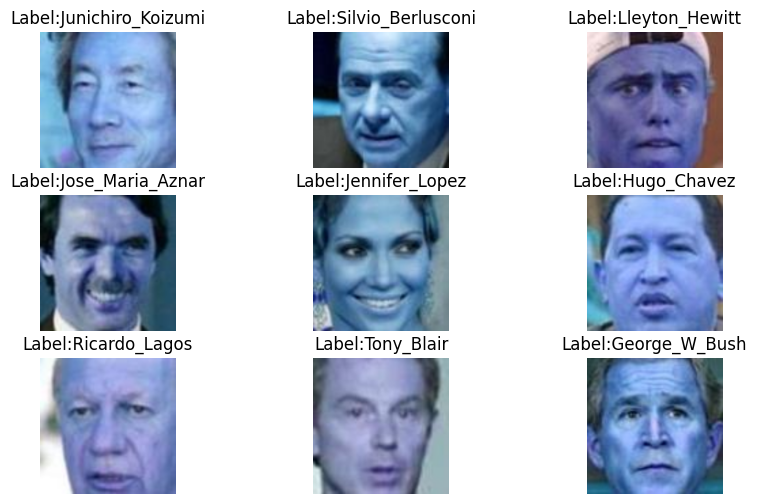

In [ ]:
# Plot several images and labels
plt.figure(figsize=(10, 6))
data = iter(train_dataloader)
for n in range(9):
    ax = plt.subplot(3, 3, n+1)
    image, labels = next(data)
    img = image[0].permute(1, 2, 0).squeeze()
    plt.imshow(img.numpy())
    plt.title('Label:' + str(name_list[labels[0]]))
    plt.axis('off')

# **Task 1: Train the model**

In [ ]:
!pip -q install vit_pytorch linformer

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.3/100.3 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 6.4 MB/s eta 0:00:00


In [ ]:
from vit_pytorch.efficient import ViT
from linformer import Linformer
from tqdm import tqdm


In [ ]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda', index=0)

In [ ]:
efficient_transformer = Linformer(
    dim=128, # dimension of the attention heads
    seq_len=49+1,  # length of input sequences: 7x7 patches + 1 class token
    depth=12, # number of stacked encoder blocks in the model
    heads=8, # number of attention heads
    k=64  # reduce the input dimension for efficiency
)

In [ ]:
model = ViT(
    dim=128, # dimension of the attention heads
    image_size=224, # resolution of images
    patch_size=32, # size of image patches
    num_classes=62, # number of classes
    transformer=efficient_transformer, # the transformer backbone
    channels=3, # number of channels in images
)

In [ ]:
model.to(device)

ViT(
  (to_patch_embedding): Sequential(
    (0): Rearrange('b c (h p1) (w p2) -> b (h w) (p1 p2 c)', p1=32, p2=32)
    (1): LayerNorm((3072,), eps=1e-05, elementwise_affine=True)
    (2): Linear(in_features=3072, out_features=128, bias=True)
    (3): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
  )
  (transformer): Linformer(
    (net): SequentialSequence(
      (layers): ModuleList(
        (0-11): 12 x ModuleList(
          (0): PreNorm(
            (fn): LinformerSelfAttention(
              (to_q): Linear(in_features=128, out_features=128, bias=False)
              (to_k): Linear(in_features=128, out_features=128, bias=False)
              (to_v): Linear(in_features=128, out_features=128, bias=False)
              (dropout): Dropout(p=0.0, inplace=False)
              (to_out): Linear(in_features=128, out_features=128, bias=True)
            )
            (norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
          )
          (1): PreNorm(
            (fn): Fe

In [ ]:
# loss function
criterion = nn.CrossEntropyLoss()
# optimizer
optimizer = optim.Adam(model.parameters(), lr=1e-4)

In [ ]:
epochs = 20

train_loss_list = []
val_loss_list = []
train_acc_list = []
val_acc_list = []


for epoch in range(epochs):
    epoch_loss = 0
    epoch_accuracy = 0

    for data, label in tqdm(train_dataloader):
        data = data.to(device)
        label = label.to(device)

        output = model(data)
        loss = criterion(output, label)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        acc = (output.argmax(dim=1) == label).float().mean()
        epoch_accuracy += acc / len(train_dataloader)
        epoch_loss += loss / len(train_dataloader)

    with torch.no_grad():
        epoch_val_accuracy = 0
        epoch_val_loss = 0
        for data, label in val_dataloader:
            data = data.to(device)
            label = label.to(device)

            val_output = model(data)
            val_loss = criterion(val_output, label)

            acc = (val_output.argmax(dim=1) == label).float().mean()
            epoch_val_accuracy += acc / len(val_dataloader)
            epoch_val_loss += val_loss / len(val_dataloader)

    # Append values to the lists
    train_loss_list.append(epoch_loss.item())
    val_loss_list.append(epoch_val_loss.item())
    train_acc_list.append(epoch_accuracy.item())
    val_acc_list.append(epoch_val_accuracy.item())

    print(
        f"Epoch : {epoch+1} - loss : {epoch_loss:.4f} - acc: {epoch_accuracy:.4f} - val_loss : {epoch_val_loss:.4f} - val_acc: {epoch_val_accuracy:.4f}\n"
    )

100%|██████████| 48/48 [00:07<00:00,  6.41it/s]


Epoch : 1 - loss : 3.7729 - acc: 0.1667 - val_loss : 3.7042 - val_acc: 0.1719



100%|██████████| 48/48 [00:06<00:00,  7.14it/s]


Epoch : 2 - loss : 3.6940 - acc: 0.1735 - val_loss : 3.6537 - val_acc: 0.1719



100%|██████████| 48/48 [00:06<00:00,  7.67it/s]


Epoch : 3 - loss : 3.5585 - acc: 0.1847 - val_loss : 3.4296 - val_acc: 0.2027



100%|██████████| 48/48 [00:06<00:00,  7.23it/s]


Epoch : 4 - loss : 3.1071 - acc: 0.2742 - val_loss : 2.8481 - val_acc: 0.3207



100%|██████████| 48/48 [00:06<00:00,  7.49it/s]


Epoch : 5 - loss : 2.4634 - acc: 0.4281 - val_loss : 2.4077 - val_acc: 0.4341



100%|██████████| 48/48 [00:06<00:00,  7.35it/s]


Epoch : 6 - loss : 1.9343 - acc: 0.5951 - val_loss : 2.0572 - val_acc: 0.5338



100%|██████████| 48/48 [00:06<00:00,  7.42it/s]


Epoch : 7 - loss : 1.5242 - acc: 0.7200 - val_loss : 1.7130 - val_acc: 0.6504



100%|██████████| 48/48 [00:06<00:00,  7.45it/s]


Epoch : 8 - loss : 1.1829 - acc: 0.8180 - val_loss : 1.4762 - val_acc: 0.7098



100%|██████████| 48/48 [00:06<00:00,  7.62it/s]


Epoch : 9 - loss : 0.9076 - acc: 0.8796 - val_loss : 1.2801 - val_acc: 0.7549



100%|██████████| 48/48 [00:06<00:00,  7.29it/s]


Epoch : 10 - loss : 0.6780 - acc: 0.9255 - val_loss : 1.1405 - val_acc: 0.7910



100%|██████████| 48/48 [00:06<00:00,  7.35it/s]


Epoch : 11 - loss : 0.4967 - acc: 0.9578 - val_loss : 1.0065 - val_acc: 0.8104



100%|██████████| 48/48 [00:06<00:00,  7.63it/s]


Epoch : 12 - loss : 0.3526 - acc: 0.9842 - val_loss : 0.8920 - val_acc: 0.8312



100%|██████████| 48/48 [00:06<00:00,  7.54it/s]


Epoch : 13 - loss : 0.2536 - acc: 0.9945 - val_loss : 0.8439 - val_acc: 0.8291



100%|██████████| 48/48 [00:06<00:00,  7.49it/s]


Epoch : 14 - loss : 0.1800 - acc: 0.9971 - val_loss : 0.8052 - val_acc: 0.8310



100%|██████████| 48/48 [00:06<00:00,  7.62it/s]


Epoch : 15 - loss : 0.1340 - acc: 0.9997 - val_loss : 0.7679 - val_acc: 0.8351



100%|██████████| 48/48 [00:06<00:00,  7.45it/s]


Epoch : 16 - loss : 0.1018 - acc: 1.0000 - val_loss : 0.7324 - val_acc: 0.8361



100%|██████████| 48/48 [00:06<00:00,  7.46it/s]


Epoch : 17 - loss : 0.0812 - acc: 1.0000 - val_loss : 0.7274 - val_acc: 0.8419



100%|██████████| 48/48 [00:06<00:00,  7.62it/s]


Epoch : 18 - loss : 0.0679 - acc: 1.0000 - val_loss : 0.7161 - val_acc: 0.8390



100%|██████████| 48/48 [00:06<00:00,  7.49it/s]


Epoch : 19 - loss : 0.0578 - acc: 1.0000 - val_loss : 0.7079 - val_acc: 0.8312



100%|██████████| 48/48 [00:06<00:00,  7.45it/s]


Epoch : 20 - loss : 0.0505 - acc: 1.0000 - val_loss : 0.7088 - val_acc: 0.8370



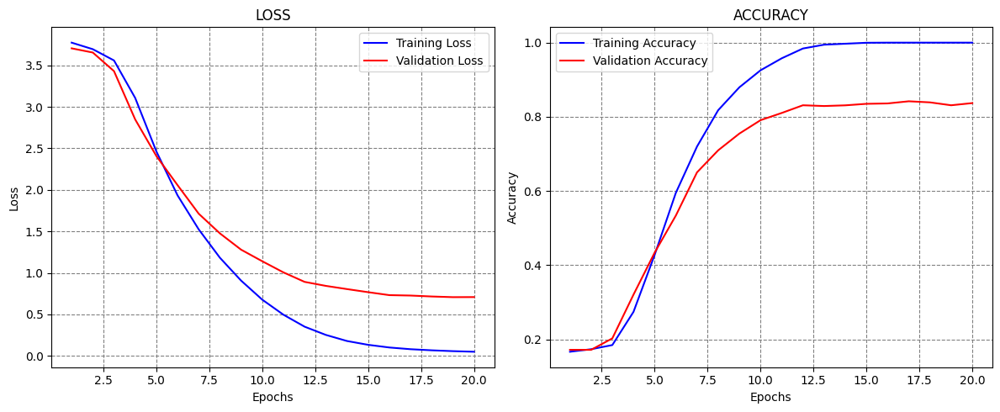

In [ ]:
# Plot the loss and accuracy
epochsn = np.arange(1, epochs + 1, 1)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(epochsn, train_loss_list, 'b', label='Training Loss')
plt.plot(epochsn, val_loss_list, 'r', label='Validation Loss')
plt.grid(color='gray', linestyle='--')
plt.legend()
plt.title('LOSS')
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.subplot(1, 2, 2)
plt.plot(epochsn, train_acc_list, 'b', label='Training Accuracy')
plt.plot(epochsn, val_acc_list, 'r', label='Validation Accuracy')
plt.grid(color='gray', linestyle='--')
plt.legend()
plt.title('ACCURACY')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

plt.tight_layout()
plt.show()

In [ ]:
# test the model
model.eval()  # it disables dropout
with torch.no_grad():
    correct = 0
    total = 0
    for images, labels in test_dataloader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    print('Test Accuracy of the model: {} %'.format(100 * correct / total))

Test Accuracy of the model: 83.60343183984747 %


# **Task 2: Adversarial samples against Clarifai’s web ML model for celebrity recognition**

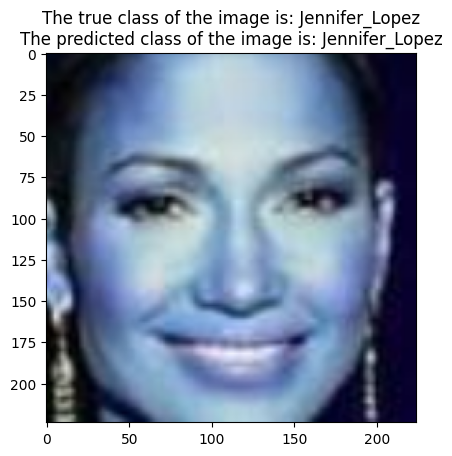

In [ ]:
# Function to plot an image with true and predicted class names and sentences
def plot_image_with_class(image, true_class_idx, predicted_class_idx):
    true_class_name = name_list[true_class_idx]
    predicted_class_name = name_list[predicted_class_idx]

    plt.imshow(image.permute(1, 2, 0))
    plt.title(f"The true class of the image is: {true_class_name}\n"
              f"The predicted class of the image is: {predicted_class_name}")
    plt.show()

# Get the image and label of Jennifer Lopez with index 343
jlo_image, jlo_label = test_dataset[343]
plot_image_with_class(jlo_image, jlo_label.item(), model(jlo_image.unsqueeze(0).to(device)).argmax().item())



In [ ]:
epsilons = [20/255, 30/255, 40/255, 50/255, 80/255]

correct = 0
total = 0
accuracies_PGD =[]
sub_dataset = Subset(test_dataset, [343])
subsest_dataloader = DataLoader(sub_dataset, batch_size=1)

In [ ]:
def evaluate_epsilons_part(model, subsest_dataloader, epsilons):
    accuracies_PGD = []

    for epsilon in epsilons:
        print(f"Epsilon: {epsilon}")
        correct = 0
        total = 0
        accuracy = []

        for data in subsest_dataloader:
            images, labels = data
            images = images.cuda()
            labels = labels.cuda()

            adversarial_image = projected_gradient_descent(model_fn=model, x=images, eps=epsilon, eps_iter=2.5*epsilon/60, nb_iter=60, norm=np.inf)
            outputs = model(adversarial_image)
            _, predicted = torch.max(outputs.data, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            accuracy.append(correct / total)

        accuracies_PGD.append(np.mean(accuracy))

    return accuracies_PGD

result_accuracies_PGD = evaluate_epsilons_part(model, subsest_dataloader, epsilons)
print(result_accuracies_PGD)

Epsilon: 0.0784313725490196
Epsilon: 0.11764705882352941
Epsilon: 0.1568627450980392
Epsilon: 0.19607843137254902
Epsilon: 0.3137254901960784
[0.0, 0.0, 0.0, 0.0, 0.0]


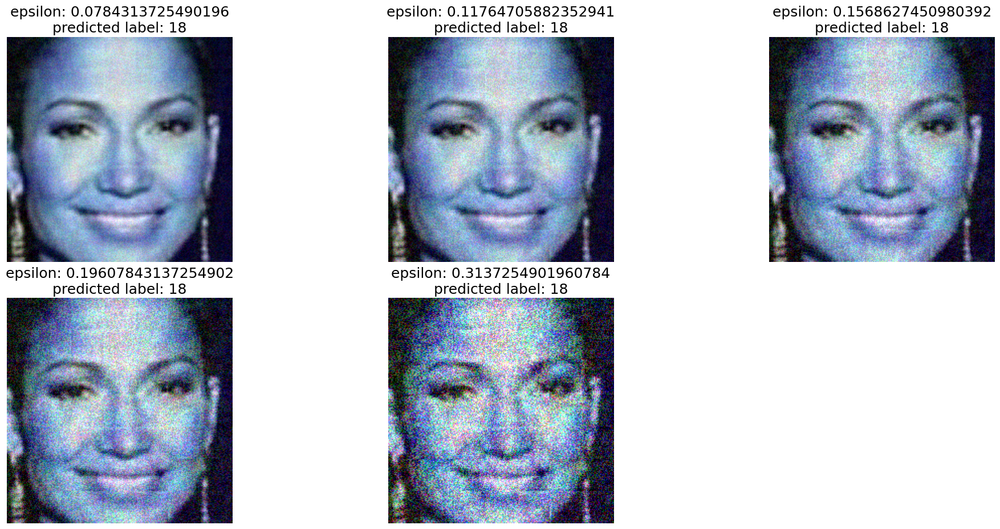

In [ ]:
import torchvision.transforms.functional as TF
from torchvision.utils import save_image

def plot_and_save_adversarial_images(model, subsest_dataloader, epsilons, output_path='./adversarial_images/'):
    # Create output_path directory if it doesn't exist
    os.makedirs(output_path, exist_ok=True)

    plt.figure(figsize=(20, 25), constrained_layout=True)
    cnt = 1

    for data in subsest_dataloader:
        for epsilon in epsilons:
            images, labels = data
            images = images.cuda()
            labels = labels.cuda()

            adversarial_image = projected_gradient_descent(model, images, epsilon, eps_iter=epsilon/10, nb_iter=60, norm=np.inf)
            outputs = model(adversarial_image)
            _, predicted = torch.max(outputs.data, 1)

            plt.subplot(6, 3, cnt)
            img = adversarial_image.cpu().detach().numpy()[0]
            img = np.transpose(img, [1, 2, 0])
            plt.imshow(img)
            label = predicted.cpu().detach().numpy()[0]
            plt.title('epsilon: ' + str(epsilon) + '\n' + 'predicted label: ' + str(label), fontsize=18)

            plt.axis('off')

            # Convert PIL Image to PyTorch tensor before saving
            adversarial_tensor = TF.to_tensor(TF.to_pil_image(adversarial_image[0].cpu()))
            save_image(adversarial_tensor, os.path.join(output_path, f'img_{cnt}_epsilon_{epsilon}.jpg'))

            cnt += 1
        break

    plt.show()

#Usage:
plot_and_save_adversarial_images(model, subsest_dataloader, epsilons)

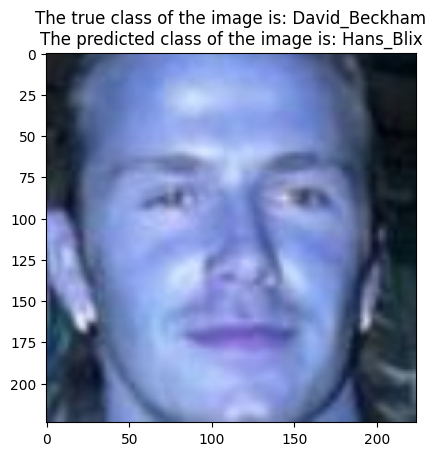

In [ ]:
# Get the image and label of David Bekham with index 442
dvdbkhm_image, dvdbkhm_label = test_dataset[442]
plot_image_with_class(dvdbkhm_image, dvdbkhm_label.item(), model(dvdbkhm_image.unsqueeze(0).to(device)).argmax().item())

Epsilon: 0.0784313725490196
Epsilon: 0.11764705882352941
Epsilon: 0.1568627450980392
Epsilon: 0.19607843137254902
Epsilon: 0.3137254901960784
[0.0, 0.0, 0.0, 0.0, 0.0]


<Figure size 2000x2500 with 0 Axes>

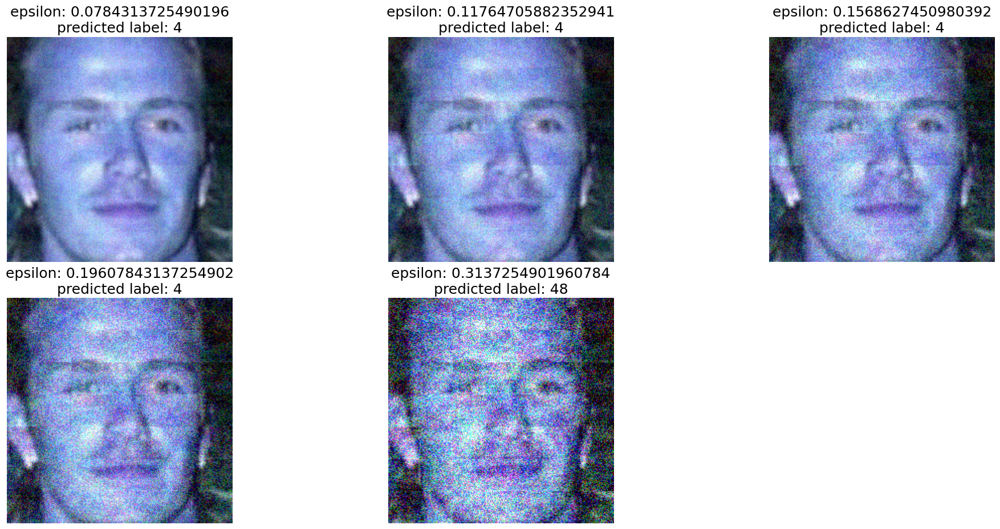

In [ ]:
sub_dataset = Subset(test_dataset, [442])
subsest_dataloader = DataLoader(sub_dataset, batch_size=1)

result_accuracies_PGD = evaluate_epsilons_part(model, subsest_dataloader, epsilons)
print(result_accuracies_PGD)

plt.figure(figsize=(20, 25), constrained_layout=True)
cnt = 1

plot_and_save_adversarial_images(model, subsest_dataloader, epsilons)

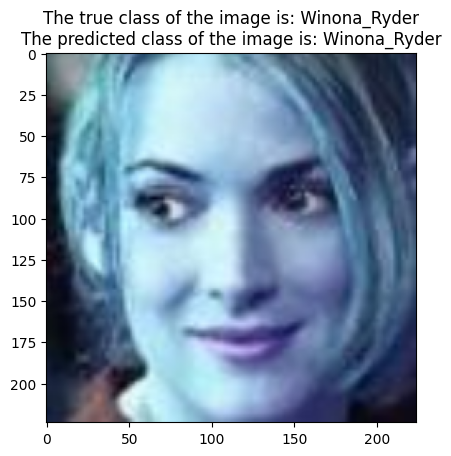

In [ ]:
 # Get the image and label of Winona Ryder with index 53

wnrydr_image, wnrydr_label = test_dataset[53]
plot_image_with_class(wnrydr_image, wnrydr_label.item(), model(wnrydr_image.unsqueeze(0).to(device)).argmax().item())

Epsilon: 0.0784313725490196
Epsilon: 0.11764705882352941
Epsilon: 0.1568627450980392
Epsilon: 0.19607843137254902
Epsilon: 0.3137254901960784
[0.0, 0.0, 0.0, 0.0, 0.0]


<Figure size 2000x2500 with 0 Axes>

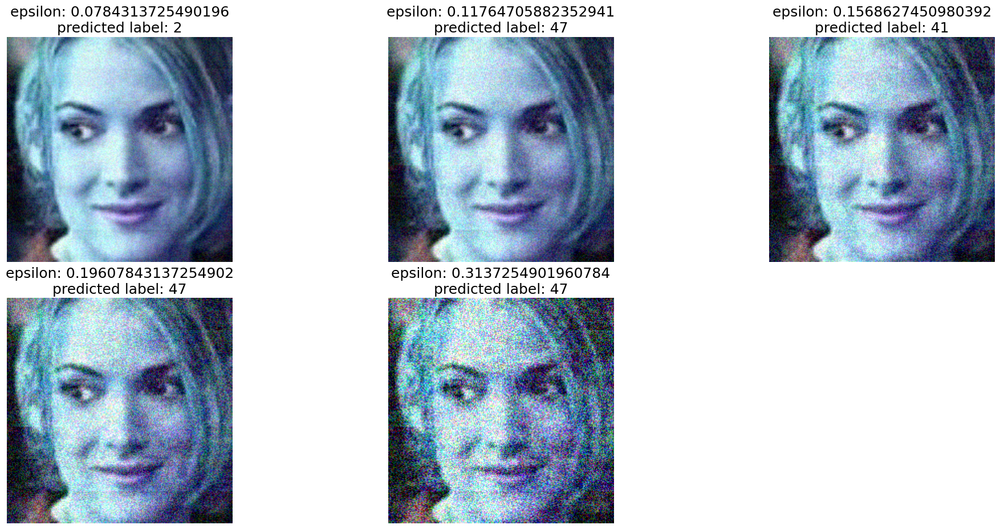

In [ ]:
sub_dataset = Subset(test_dataset, [53])
subsest_dataloader = DataLoader(sub_dataset, batch_size=1)

result_accuracies_PGD = evaluate_epsilons_part(model, subsest_dataloader, epsilons)
print(result_accuracies_PGD)

plt.figure(figsize=(20, 25), constrained_layout=True)
cnt = 1

plot_and_save_adversarial_images(model, subsest_dataloader, epsilons)

In [59]:
from google.colab import files
from IPython.display import Image
uploaded = files.upload()

Saving Lowest_epsilon_0.1568627450980392_Wnrydr.png to Lowest_epsilon_0.1568627450980392_Wnrydr.png


# **Report:**

The model shows noticeable improvement in performance as it undergoes training, with positive trends in both training and validation metrics. The training loss consistently goes down, indicating effective learning, and the training accuracy steadily increases, reaching 100% by the end of the training process. Similarly, the validation loss decreases progressively, highlighting the model's ability to generalize to new, unseen data. The validation accuracy also shows positive growth, reaching a peak of 83.70% in the final epoch. These results suggest that the model not only learns well from the training data but also excels at accurately classifying new samples. Overall, it demonstrates strong potential for making precise predictions on both the training and validation sets. This model also received test accuracy of: 83.60 %.

I implemented these perturbation levels for the image to be misclassified:

epsilons = [20/255, 30/255, 40/255, 50/255, 80/255]

For me, performing the attack was not hard but trying to find the lowest pertrubation was. The Clarifai's model was robust, in the sense that it was able to successfully classify some of the test even with high level of pertrubation applied on the adversarial image.

I did 3 tests which are discussed below, following with their adversarial images and misclassification by the Clarifai’s model.

**1) Jennifer Lopez:**

Our model successfully classified the image as Jennifer Lopez at the beginning of Task 2. I then applied various perturbation levels to this image to test it against Clarifai's model. Surprisingly, Clarifai's model successfully classified the image for the first few adversarial images with a low perturbation level. The lowest perturbation level at which Clarifai's model misclassified the image as Jodie Marsh was 50/255 (0.19607843137254902).

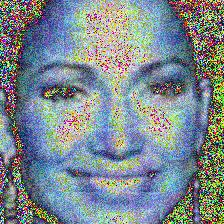

In [54]:
Image('img_4_epsilon_0.19607843137254902.jpg')

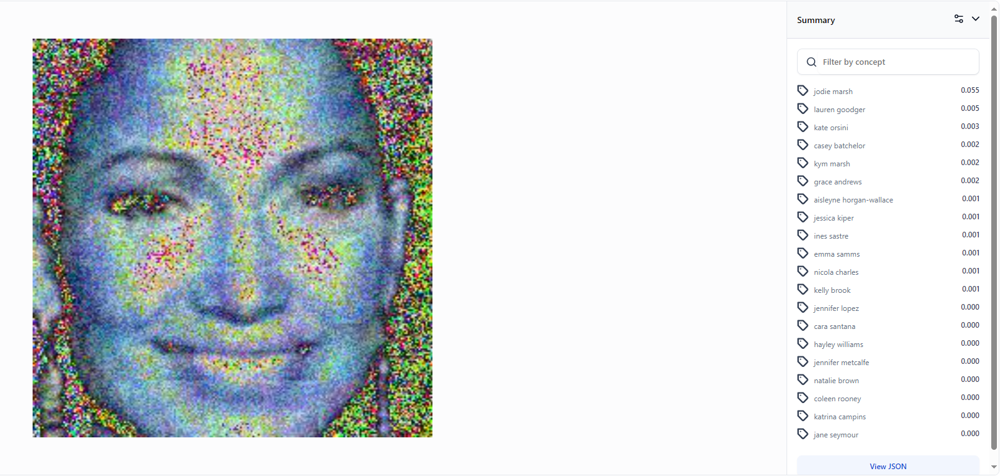

In [56]:
Image('Lowest_epsilon_0.19607843137254902_jlo.png', width=1000)

**2) David Bekham:**

Our model was unable to classify the image as David Beckham; instead, I received a prediction for Hans Blix. After applying perturbation levels and testing against Clarifai's model, the lowest perturbation level at which Clarifai's model misclassified the image as Orlando Bloom was 30/255 (0.11764705882352941).

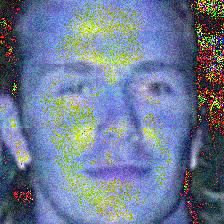

In [46]:
Image('img_2_epsilon_0.11764705882352941.jpg')

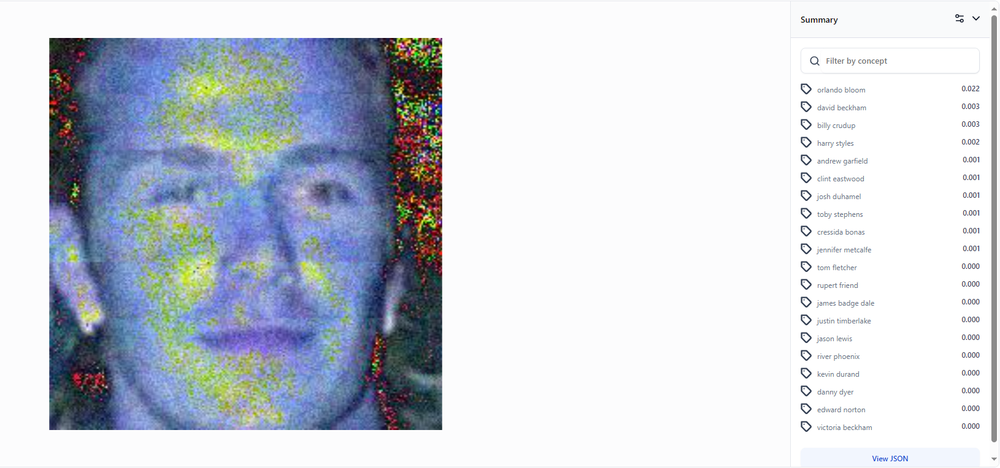

In [57]:
Image('Lowest_epsilon_0.11764705882352941_bkhm.png', width=1000)

**3) Winona Ryder:**

Our model was able to successfully classify the image as Winona Ryder. After applying perturbation levels and testing against Clarifai's model, the lowest perturbation level at which Clarifai's model misclassified the image as Georgina Grenville was 40/255 (0.1568627450980392).

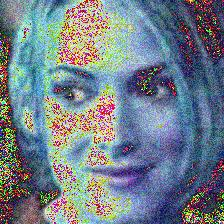

In [60]:
Image('img_3_epsilon_0.1568627450980392.jpg')

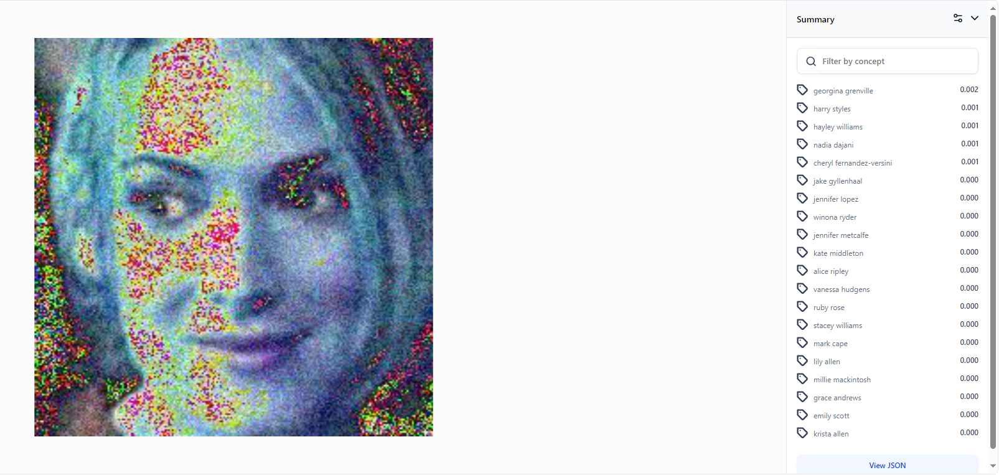

In [61]:
Image('Lowest_epsilon_0.1568627450980392_Wnrydr.png', width=1000)